In [36]:
%pylab inline
import pandas as pd

Populating the interactive namespace from numpy and matplotlib


In [37]:
df = pd.read_csv("all_processed2.csv")
df.head(2)
df.columns.tolist()

['Unnamed: 0',
 'Unnamed: 0.1',
 'company',
 'location',
 'dates',
 'job-title',
 'summary',
 'pros',
 'cons',
 'advice-to-mgmt',
 'overall-ratings',
 'work-balance-stars',
 'culture-values-stars',
 'carrer-opportunities-stars',
 'comp-benefit-stars',
 'senior-mangemnet-stars',
 'helpful-count',
 'link',
 'summary_processed',
 'summary_char_length',
 'summary_word_count',
 'summary_stopword_count',
 'summary_stopword_freq',
 'pros_processed',
 'pros_char_length',
 'pros_word_count',
 'pros_stopword_count',
 'pros_stopword_freq',
 'cons_processed',
 'cons_char_length',
 'cons_word_count',
 'cons_stopword_count',
 'cons_stopword_freq',
 'text',
 'text_processed',
 'text_char_length',
 'text_word_count',
 'text_stopword_count',
 'text_stopword_freq']

### At this point there were still rows left with None or NaN values in summary, pros or cons. We went and removed these rows

In [38]:
df.count()[0]

67399

In [39]:
df = df[df["summary"].notna()]
df = df[df["pros"].notna()]
df = df[df["cons"].notna()]
df = df[df["overall-ratings"].notna()]

0 rows was removed.

In [40]:
df.count()[0]

67399

### In order to make it easier to work with the data we added a new column containing the text for summary, pros and cons.

In [41]:
df[["summary","pros","cons", "text"]].head(3)

,summary,pros,cons,text
0,Best Company to work for,People are smart and friendly,Bureaucracy is slowing things down,Best Company to work for People are smart and ...
1,"Moving at the speed of light, burn out is inev...","1) Food, food, food. 15+ cafes on main campus ...",1) Work/life balance. What balance? All those ...,"Moving at the speed of light, burn out is inev..."
2,Great balance between big-company security and...,"* If you're a software engineer, you're among ...","* It *is* becoming larger, and with it comes g...",Great balance between big-company security and...


Mean text length in characters

In [42]:
np.mean(df["text"].str.len())

332.1738007982314

In [43]:
df["overall-ratings"].head()

0    5.0
1    4.0
2    5.0
3    5.0
4    5.0
Name: overall-ratings, dtype: float64

In [74]:
pd.set_option('display.max_colwidth', 800)
(df[df["overall-ratings"] == 5])[["summary", "pros", "cons"]].head(10)

,summary,pros,cons
12265,Technical Program Manager,Lot of opportunities to expand your career and impact free lunch in some subsidiaries very open culture,Very competitive You have to be comfortable with fast pace as things move very fast
39888,At Home Advisor,"great pay, great managers everyone is really nice",I needed more flexibility in changing schedule
12986,Great place to work!,"Great pay, fun atmosphere, get to customers every day lives. The leadership principles are no BS and guide pretty much every decision.","Long hours (like 45-50, and I get paid overtime) and only 1 week paid vacation. which is honestly OK considering my pay."
63998,Great job -,Laid back job for receptionist working part time,I do not have any con about this job
26127,Good work,Good work in company salary ingeryment,"Food not alowd,time long"
25711,Worth using your life time.,i feel like second family here,operational and operation oriented teams are high
8637,Great place to start your career,"Great employees, networking. Working at amazon will challenge you. Management so far has been great. Team is great","Your experience working at Amazon is highly dependent on what team you get placed on. I was an intern on another team, and I was more stressed out during that time period than I currently am at my full time position."
25723,Good,Product based company allows to learn many things with out time constraints. Technical growth is way better than service based companies,Time management is one of the main things that need to balanced. Managing personal life and professional life is little difficult
66432,Great company - smart people - savvy business,"Driven, hard working individuals who care about the company, the product but also the society that they live in - Microsoft doesn't make products to just make $$$'s - but to try and improve the world.",Can be very (Redmond) US centric
55853,.,good place to work and learn.,work can be stressful sometimes


In [75]:
(df[df["overall-ratings"] == 4])[["summary", "pros", "cons"]].head(10)

,summary,pros,cons
61823,Inventory Control Expert,Great perks and learning from management and systems. lots of exposure.,Growth from retail to cooperate not there
15503,Good Idea,A lot of money saved by working from home. Chance to move upwards within Amazon. The opportunity to become a blue badge employee.,The strict attendance policy and Unpaid time policy needs to be relaxed a bit. I would offer better benefits to seasonal FT employees.
7210,Local Data Quality Evaluator - Geo EMEA,Good opportunities to move on new and higher position,Lack of communication between management and employees
41955,Apple,- work life balance - colleagues - tech fan culture,- senior management - not enough communication
30594,Great Place Overall!,"Exposure, Excitement, Leadership skills and a great learning opportunity. Some of the best minds to collaborate and work with.","Hierarchy, as much as they deny is still prevalent, at least in India"
61923,Very good employer,"Benefits for employees, competitive salary","Unstable, one can get redundant with no respect to person's professional success"
13626,Great place to work,"High salary, relaxed work environment",Lack of available in-office perks
65678,Lots of fun. Energetic. Informal.,Worked in India(Hyderabad) office. The campus like feel of the office is amazing. People are very friendly. Work life balance is very good.,"Sometimes lot of projects in maintenance mode comes into India, which make the work less challenging for senior engineers."
48019,Working for Apple,"Great atmosphere, multinational company. Overtime is paid.",your position is not secured until you receive your permanent contract.
51898,Microsoft UX Designer,"Great meaningful work! Workplace is full of genuine, intelligent people",Projects move slowly as progress has to go through so many hoops to be approved. Sometimes projects can be shut down midway


In [76]:
(df[df["overall-ratings"] == 3])[["summary", "pros", "cons"]].head(10)

,summary,pros,cons
30,Senior Director,"So many brilliant people Tons of resources Working on amazingly cool technologies Great culture - they really care about employees, actively ask for feedback, and act on it (e.g. Set corporate OKR's to improve on problem issues)","Becoming highly bureaucratic Growing political back stabbing, especially at the senior management levels"
37,"Great perks, bad work-life balance","Google’s perks are great: free food, shuttle to work, stock options, fun offices and amenities. The company is also full of really smart people that I’m constantly learning from.","I have zero work-life balance. I work minimum 50 hours per week, often including nights and weekends. The commute is absolutely horrendous. I’m also not a fan of the performance review structure (even though I got good ratings myself). The essays take an insane amount of time to compile and people are often promoted based on how long they’ve been at Google rather than merit."
41,Big Tech,Never have to skip a paycheck.,Google has an over abundance of technicians and under-abundance of thinkers.
48,meh,Pays really well Free food Looks good on resume,"Google wants 60-hour weeks. If you have a 150 IQ, Google is okay with 50-hour weeks, otherwise, 60-hour weeks are required to keep your job. Work is mind-numbingly boring, e.g. sustaining software written 10-20 years ago, mostly. Culture is declining QUICKLY Too many people are competing for your job so Google has CS PhDs doing plumbing work."
61,not too bad,nice food，nice place ，nice people,i cannot understand what they talk
66,Engineer,salary was fine but in line with other companies,work was boring. I disliked it.
83,"Great perks, interesting colleagues, zero work/life balance","-Amazing Perks in NYC: gym, rooftop terrace, unlimited food and snacks for breakfast lunch dinner, beautiful spaces -Brand notoriety -working with smart people -lots of resources available to you",-zero work/life balance esp in on east coast -disorganized teams -focus on making hires and meeting numbers and goals as opposed to the bigger picture -very junior staff - very robotic - read off scripts or sound disingenuous -lack of diversity
92,Administrative Business Partner - Sales,Fantastic benefits. It's great to have Google on your resume.,"Directors will never understand what you do on a daily basis in this role. Your performance review isn't based on a scale, but instead it ends up being based on a pass/fail opinion. A poor director/admin fit means that the admin will suffer. Admins have to step up to offer emotional/career support for each other because there is not an internal management system in place specifically for them. You will need to give 110% every day because 100% is never enough."
108,Average with a hint of arrogance,"Lots of interesting projects to learn from, great place for a junior engineer.",Google culture is full of hype and self imposed sense of uniqueness. If you have worked at a large company before it will feel annoying.
119,Analyst,Good company culture and work environment,None that I had working there


In [77]:
(df[df["overall-ratings"] == 2])[["summary", "pros", "cons"]].head(10)

,summary,pros,cons
54,Depends on what you're looking for,"For the right people it can be a great place. Good compensation, free food, massages, relaxed work environment.",Projects can be boring or useless. Work may not be appreciated. Performance evaluation can be random. Colleges can be very nerdy and may never talk to you. SWEs may treat you like second-class citizens (even though the company emphasizes respect).
90,China Search Project is Concerning,"Intellectually stimulating place with many ""benefits""",I think the culture has lost its way. It's a shame.
142,Fun perks - wouldn’t contract there again,"Perks were great, as well as being around intelligent people.",Being a contractor I didn’t recrive a lot of responsibility or work. I felt very unused & undervalued
147,Was ok to work there but not fast paced,great food offered but quality went down a bit with time as employee count went up,pace of work is slow and have too many hires for a small piece of work.
183,Meh,"Good pay, benefits, and free food.",Spend more time sending emails than doing actual work.
221,A company culture build around the millenial sterotype,Cost or budget is never a concern.,"The company culture is like a millennial personified--by lunch on the first day I was already annoyed by the exceedingly in-your-face liberal political culture. Evals and promotions are based on the importance of your project and your ability to kiss up to peers. Lunches are mediocre at MTV and everyone there's a long wait during typical lunch hours. The hiring process results in a more consistent level of hires, but despite their claims the average hire at a 65K or 80K+ populous company are at best Bs rather than As. Nobody cares to do actual work, and the open floorplans means you'll have to tune out personal non-work-related chatter all day."
357,Google Cloud,"Access to the larger Google culture and benefits -- gyms, food, campus benefits, etc.","I hear from people around the company that Google proper is great and that Cloud is not representative of the true Google work experience. Either way, Cloud is pretty terrible. Extremely hierarchical, micromanagement culture that treats people with a lot of disrespect. No trust in people. Leadership by fear. Leadership team is half competent other half incompetent. Not unusual for people to be thrown under the bus by managers."
379,Account Manager,"benefits: free breakfast, lunch, gym + classes, dogs in the office, work from home or other offices, foot in the door to get Google on your resume.","this job is absolutely soul-crushing. by a year in the benefits don't matter anymore. this is the worst job that exists at Google. absolutely no work/life balance. the targets are becoming outrageous, many people cry in private, there seems to be little hope of ever getting promoted, management is so beyond out of touch with the day-to-day grind of this brutal job."
382,"Google is great, recruiting org not so much","Free food Google campus atmosphere Bright, friendly colleagues (when you aren’t working directly with them!) Salary","The recruiting org at Google is a toxic environment- point blank. Constant political plays, people throwing others under the bus (sometimes even by their own manager), the passive aggressiveness pervades all emails and announcements. Constant reorganization leads to people panicking or politicizing for a new role to jump ship. High turnover and low, low morale! Fear based leadership. Coming across people crying in the office or having anxiety issues is not uncommon. How can your recruiters sell people to work at company when they’re constantly suffering from anxiety and mental health issues?!"
384,Okay place to work,The pay is pretty good,Apparently they cant get crabby patties for lunch


In [78]:
(df[df["overall-ratings"] == 1])[["summary", "pros", "cons"]].head(10)

,summary,pros,cons
100,pockets of incompetence,"Overall, Google pays well and showers people with perks. There are pockets of excellence. The company is extremely profitable.","There are deep, deep pockets of dysfunction and incompetence at Google. Do your due diligence on the team and manager you're considering joining. There are bozos at every company, and Google is no exception to this rule."
122,WTF are they even doing?,Pay was excellent. Perks were great. Office was awesome. Lunch was usually delicious.,"-I started just before a big reorg. I had 9 different managers in 7 months. Each had a drastically different goal for me to achieve. -No real vision toward anything groundbreaking in terms of the ad products. -Way too much ego. One manager actually told me, after an inclusivity meeting, that he could only handle so much kumbaya and lesbianism. WTF. You don’t even know me but you say that??"
149,Google is racist company,O you have got to be kidding me.......,Is ran by a pack of 12 years old kids.........
186,CEO who doesn't listen to employees,-Free food (snacks and cafes) -Massage chairs,-Hard to get promoted -Poor planning on projects for such a big company
226,"Great from afar, dysfunctional from within","There are pros to working at Google - it looks great on the resume because of its history, it is a known quantity in the industry, performers get a lot of stock, it's not yet an antiquated giant (but moving in that direction pretty fast.) , generally people are friendly (lower the level, better the people - the opposite is also true. Higher the level, worse the ""Googleyness"" of the people)","- Free food : I have actually had better ""free"" food at other companies, and this free food comes at a high price - you work - all the time. Through lunch. Through breakfast. Sometimes through dinner. Quality isn't so great either. - Management - really terrible (horrible) management. They are completely out of sync with what is needed, or what is missing, a lot of them are simply cruising, and generally they are pretty terrible @ their job. Of course there are some great teams, and if you are lucky, you will end up in these teams - Burnout - especially on the cloud side - is happening at an alarming rate - To put it simply, people are overloaded and they break - I have sadly seen it happen to several great , solid engineers (there is a reason why the average googler stays there for < ..."
235,Director of Developmental Sales & Marketing,Possibly a growth company but financial problems create much uncertainty,"I was hired through an Agency as a contract employee for 90 days, then offered a full-time position. This position lasted all of 24 days, then I was let go due to financial problems at the company. To make matters worse, I was told that I would receive severance on the forms I asked to sign. The company has reneged on that. I witnessed a parade of hiring/firing due to the lack of any business acumen, very poor communication and no evidence of a positive culture."
274,Playstore Production Associate,This team has the potential to be best they can be but they need to get out of their own way with their egotistical know it all attitude.,"This Playstore Production Management team are some of the most pompous, arrogant, juvenile punks I have ever had the misfortune of coming across. My manager wanted to know when things weren't getting done or were going wrong but when I approached him he would be defensive, accusing, openly blaming and quite snotty and offensive. This is not the hallmark of anyone cut out to manager other people. When approaching him with concerns or mistakes, he would twist and turn things around on me that I was blaming other people. And I thought, are you for real? The female manager was one of the most pompous peacocks that could of used a little ego balancing and reality check. I have news for you, you cannot brow beat, lecture and force feed your sloppy training program and then get on your high h..."
306

In [49]:
pd.set_option('display.max_colwidth', 50)

### We needed a binary label to be able to predict whether a review was positive or negative. We decided to define positive reviews as a 4-star rating or leaving the rest as negative.

In [50]:
df["label"] = df.apply(lambda row: 1 if row["overall-ratings"] >= 4 else 0, axis=1)

In [51]:
df_pos = df[df["label"] == 1]
df_neg = df[df["label"] == 0]
print("Positive: {0}, Negative: {1}".format(
        df_pos.count()[0], df_neg.count()[0])
     )

Positive: 45607, Negative: 21792


In [52]:
from sklearn.utils import resample

In [53]:
df_pos_res = resample(df_pos, 
                   n_samples=df_neg.count()[0], 
                   random_state=23)

In [54]:
df_pos_res.count()[0]

21792

In [55]:
df = df_neg.append(df_pos_res)

In [72]:
from wordcloud import WordCloud

def print_word_cloud(text_col, stopwords):
    
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black',
        stopwords = stopwords).generate(str(text_col))

    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')

    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

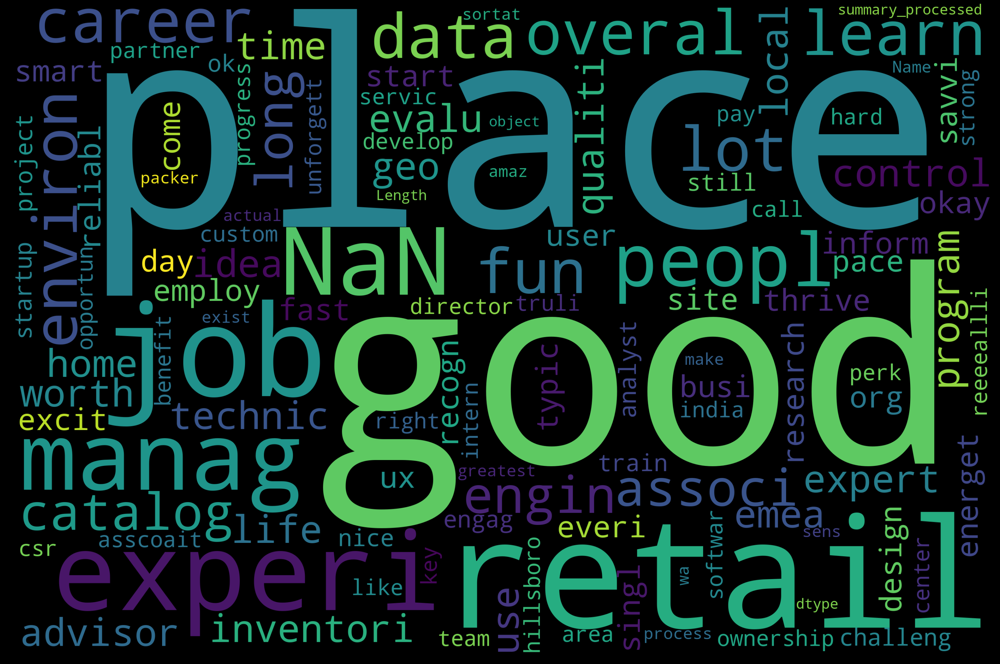

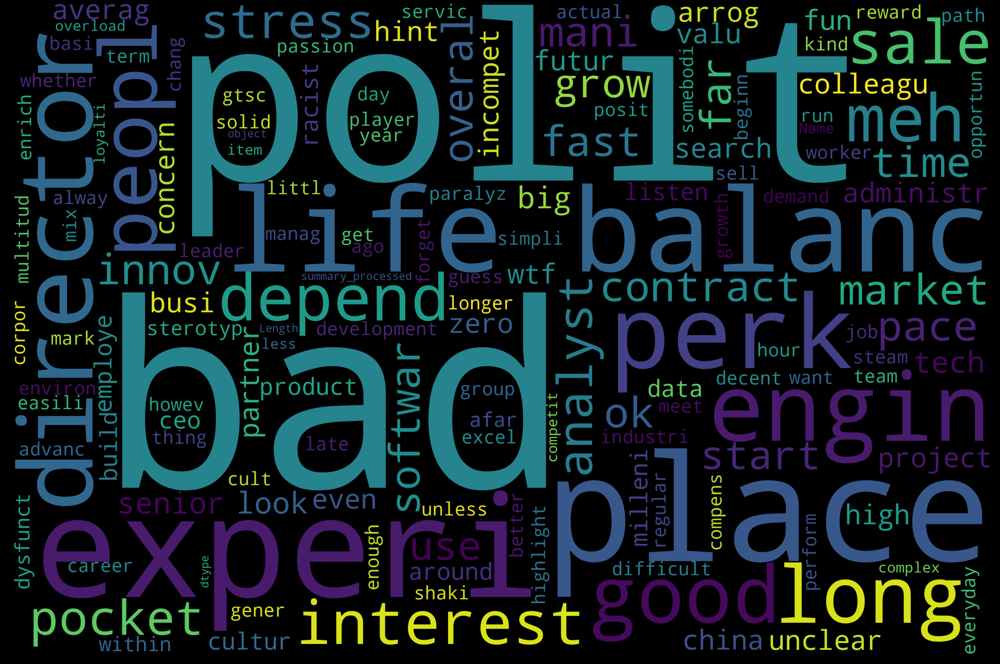

In [84]:
stopwords = ["great", "work", "compani"]

text_pos = df_pos_res["summary_processed"]
print_word_cloud(text_pos, stopwords)

text_neg = df_neg["summary_processed"]
print_word_cloud(text_neg, stopwords)

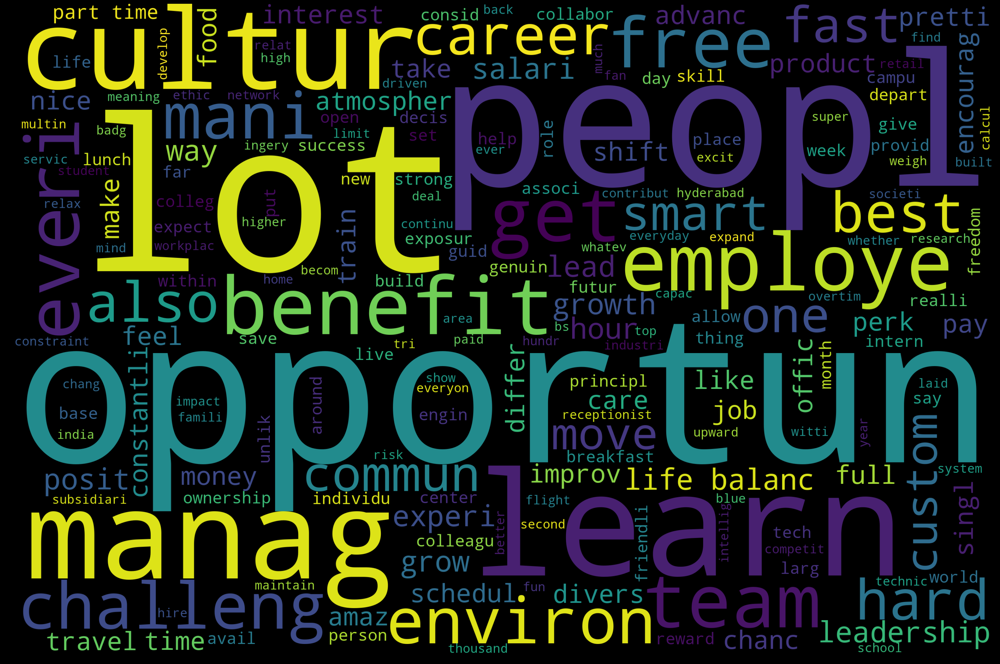

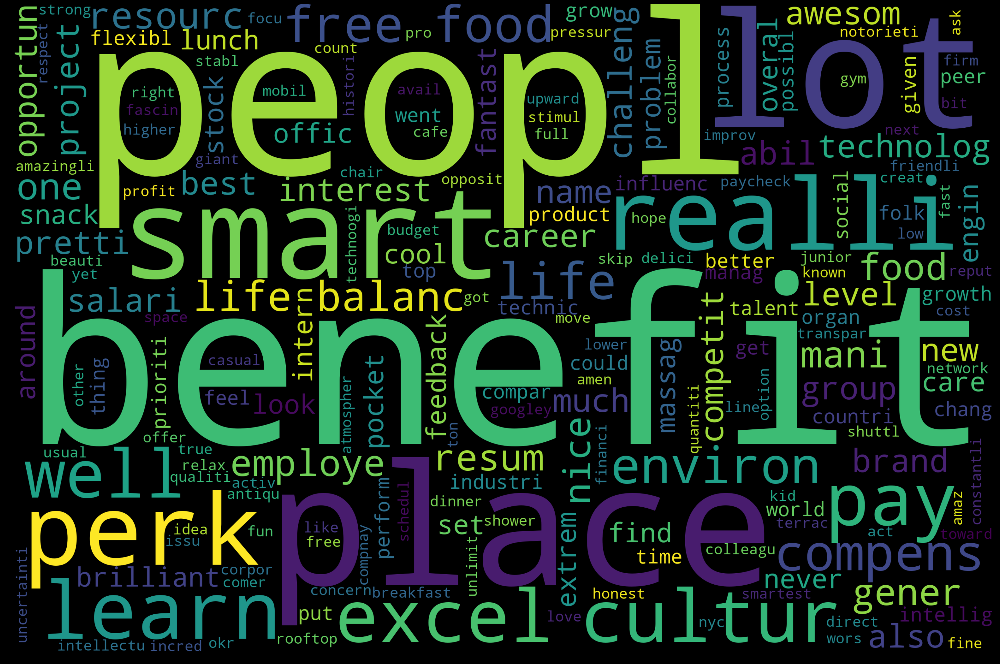

In [86]:
stopwords = ["work","great","good", "compani"]

text_pos = df_pos_res["pros_processed"]
print_word_cloud(text_pos, stopwords)

text_neg = df_neg["pros_processed"]
print_word_cloud(text_neg, stopwords)

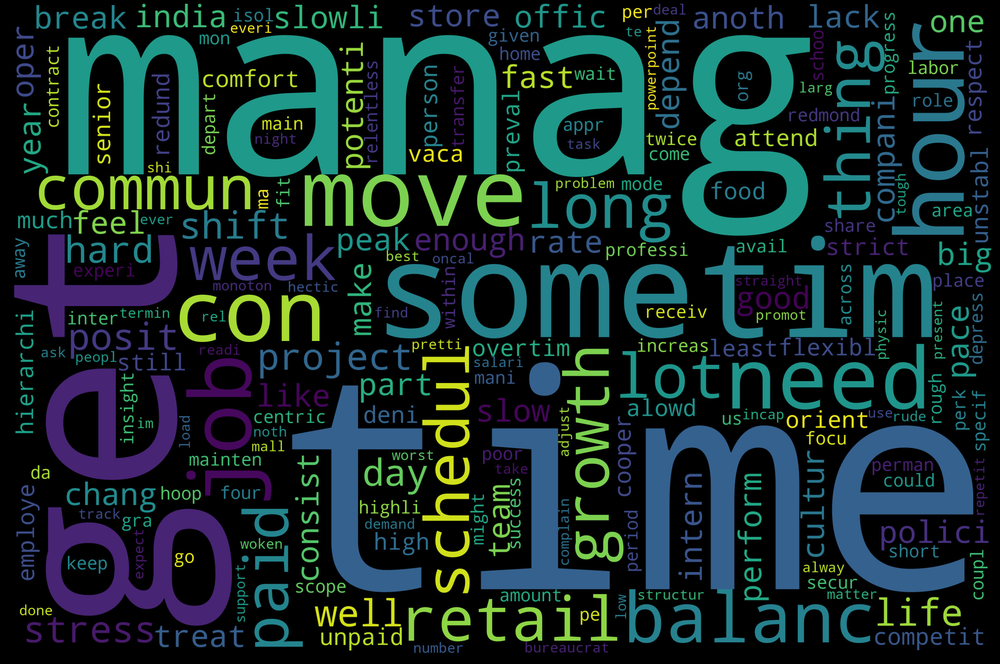

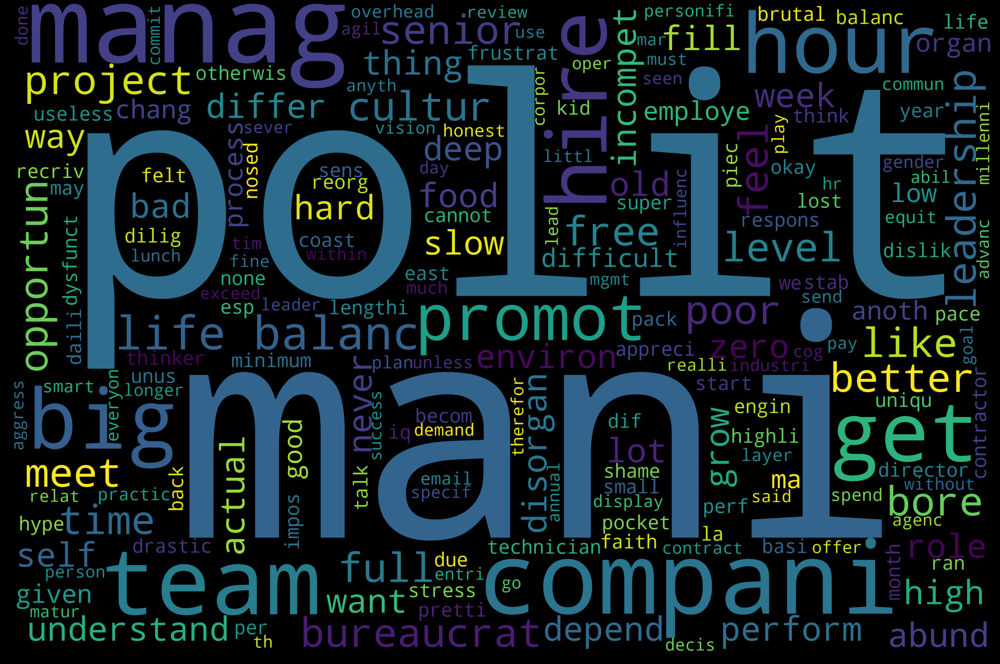

In [73]:
stopwords = ["work"]

text_pos = df_pos_res["cons_processed"]
print_word_cloud(text_pos, stopwords)

text_neg = df_neg["cons_processed"]
print_word_cloud(text_neg, stopwords)

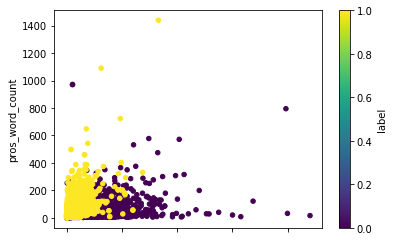

In [59]:
ax2 = df.plot.scatter(x='cons_word_count',
                       y='pros_word_count',
                       c='label',
                       colormap='viridis')

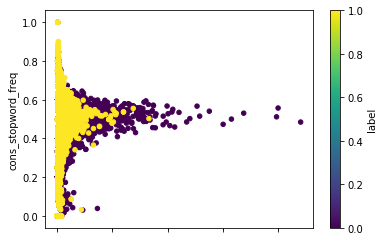

In [60]:
ax2 = df.plot.scatter(x='cons_word_count',
                       y='cons_stopword_freq',
                       c='label',
                       colormap='viridis')

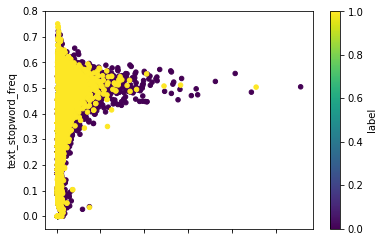

In [61]:
ax2 = df.plot.scatter(x='text_word_count',
                       y='text_stopword_freq',
                       c='label',
                       colormap='viridis')

In [89]:
import seaborn as sns

plot_index = ["pros_word_count", "pros_stopword_freq", "pros_char_length"]
plot_index.extend(["cons_word_count", "cons_stopword_freq", "cons_char_length"])
plot_index.extend(["summary_word_count", "summary_stopword_freq", "summary_char_length"])
plot_index.extend(["label"])


plot_df = df[plot_index]
#df2 = df2[:1000]

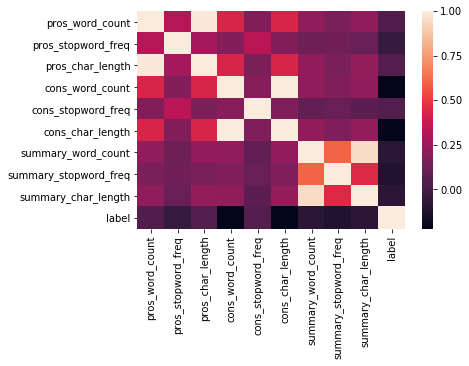

In [90]:
sns.heatmap(plot_df.corr())

In [94]:
def pairplot(clmns):
    plot_index = ["pros_word_count", "pros_stopword_freq", "pros_char_length", "label"]
    clmns.append("label")
    sns.pairplot(plot_df[clmns], hue="label", diag_kind="hist")

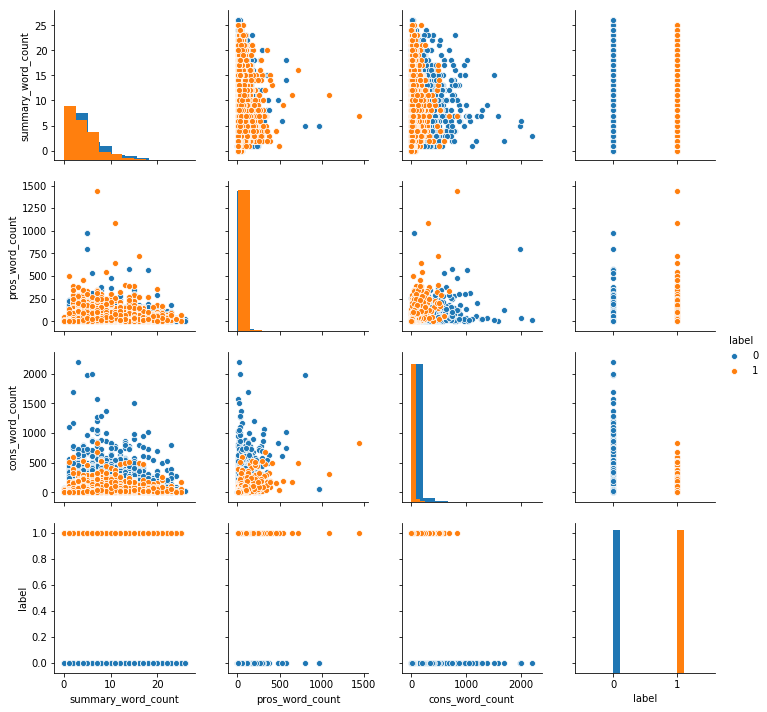

In [96]:
pairplot(["summary_word_count", "pros_word_count", "cons_word_count"])

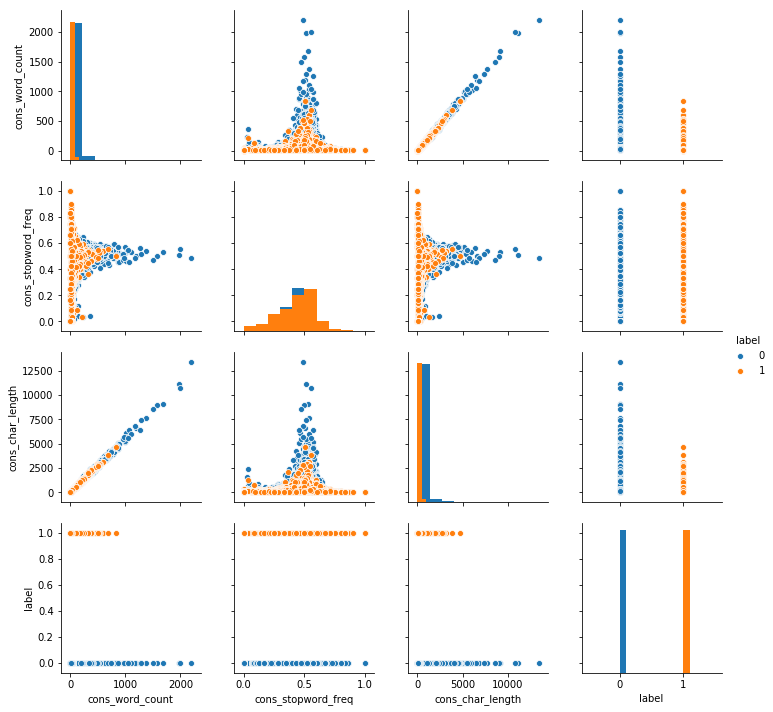

In [97]:
pairplot(["cons_word_count","cons_stopword_freq","cons_char_length"])

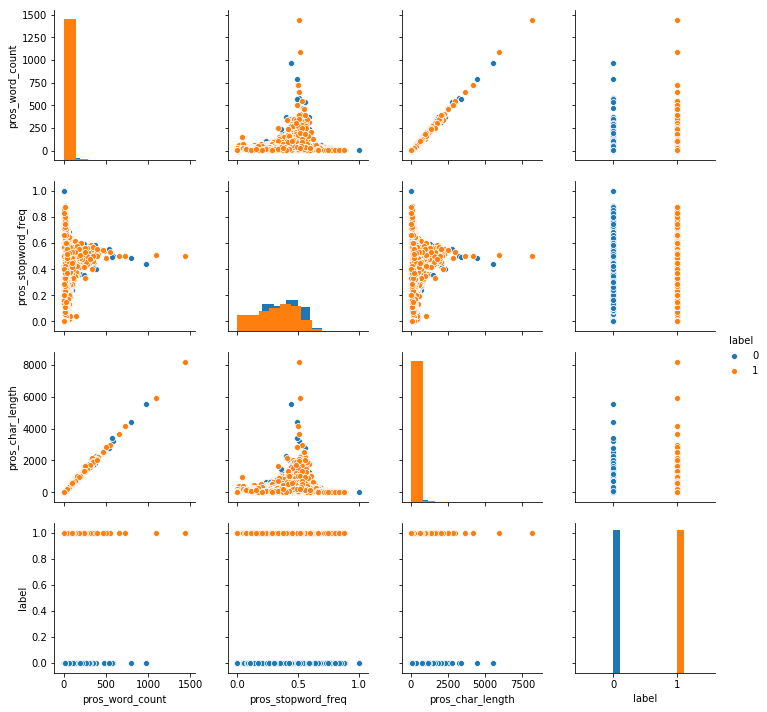

In [95]:
pairplot(["pros_word_count", "pros_stopword_freq", "pros_char_length"])

In [99]:
(df[["summary_word_count", "summary_stopword_freq", "summary_char_length"]]).head(10)

,summary_word_count,summary_stopword_freq,summary_char_length
30,2.0,0.000000,15.0
37,6.0,0.000000,34.0
41,2.0,0.000000,8.0
48,1.0,0.000000,3.0
54,7.0,0.714286,34.0
61,3.0,0.666667,11.0
66,1.0,0.000000,8.0
83,8.0,0.000000,59.0
90,5.0,0.200000,34.0
92,4.0,0.000000,39.0


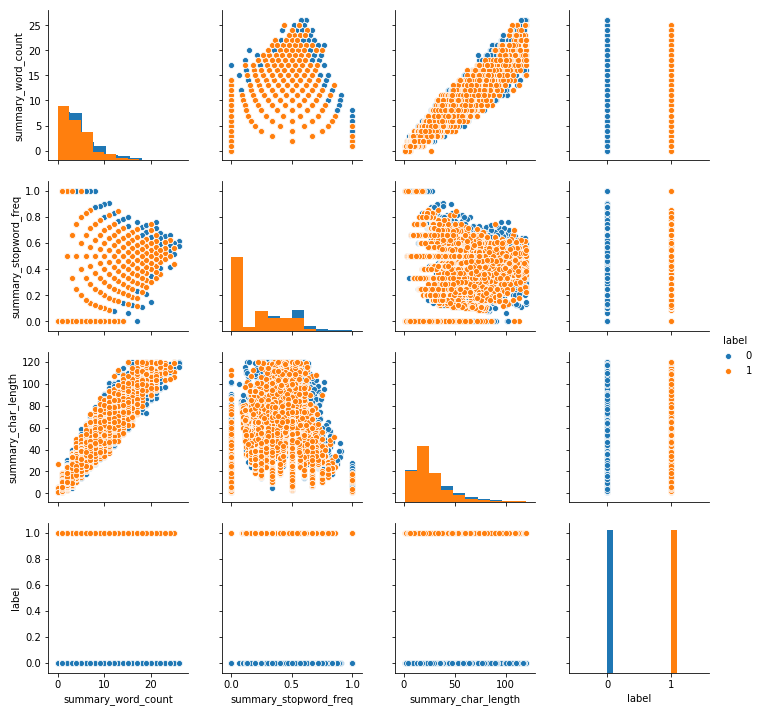

In [66]:
pairplot(["summary_word_count", "summary_stopword_freq", "summary_char_length"])

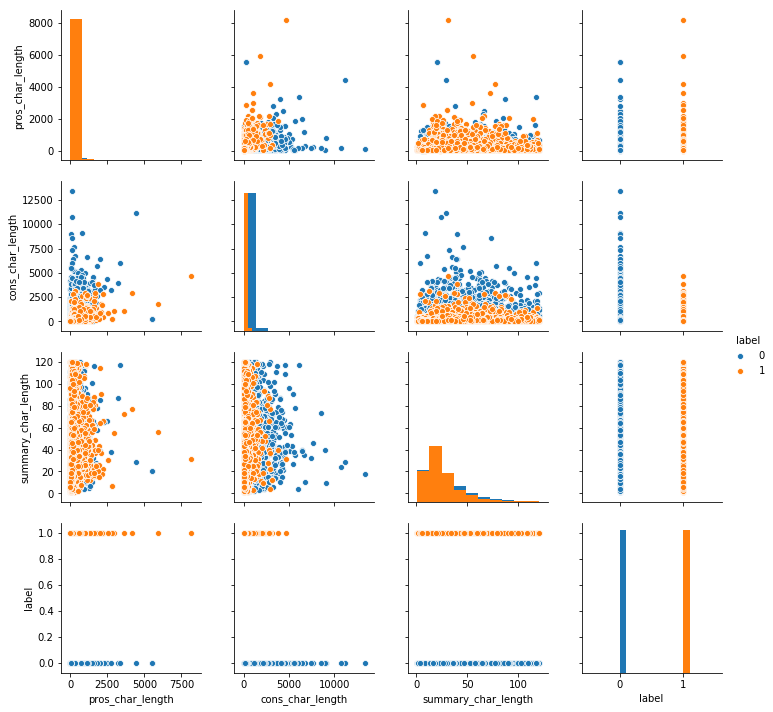

In [67]:
pairplot(["pros_char_length", "cons_char_length", "summary_char_length"])

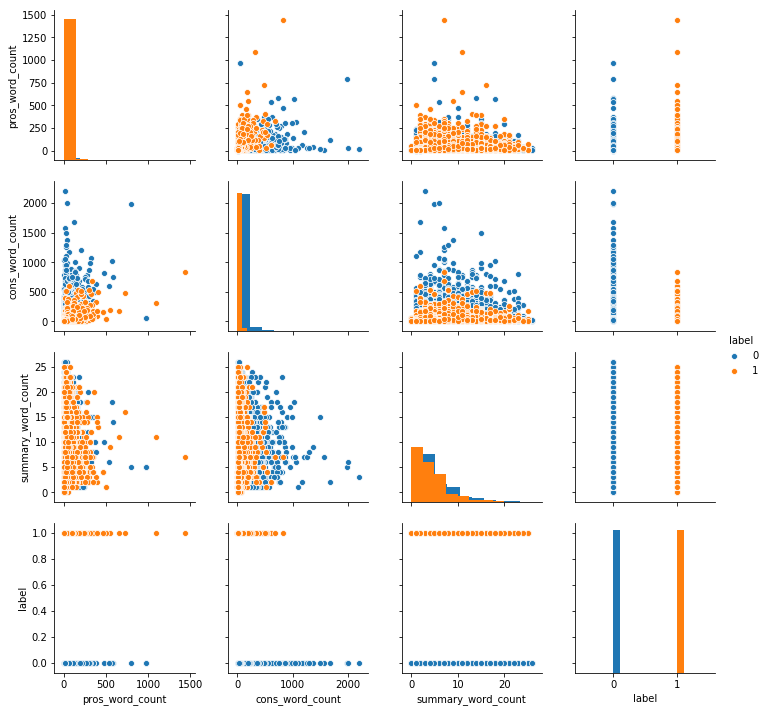

In [68]:
pairplot(["pros_word_count", "cons_word_count", "summary_word_count"])

In [20]:
from sklearn.model_selection import KFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score

y = df2["label"]
X = df2.drop(["label"], axis=1)

kf = KFold(n_splits=10, shuffle=True, random_state=4)
def do_cross_val(model):
    acc_score = cross_val_score(model, X, y, cv=kf)
    print(acc_score)
    print(np.mean(acc_score))

In [21]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

pipe_knn = make_pipeline(StandardScaler(with_mean=False), KNeighborsClassifier(n_neighbors=10))
acc = do_cross_val(pipe_knn)

[0.71795252 0.72017804 0.72329377 0.72596439 0.72299703 0.71691395
 0.73293769 0.71632047 0.71750742 0.71331058]
0.7207375862103887


In [22]:
from sklearn.linear_model import LogisticRegression

pipe_lr = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(random_state=21, solver='liblinear', C=1))
do_cross_val(pipe_lr)

[0.74376855 0.74362018 0.74940653 0.74643917 0.74391691 0.74792285
 0.76246291 0.74970326 0.73991098 0.73408518]
0.7461236511153686


In [23]:
from sklearn.tree import DecisionTreeClassifier

pipe_dt = make_pipeline(StandardScaler(with_mean=False), DecisionTreeClassifier(max_depth=45, random_state=21))
do_cross_val(pipe_dt)

[0.66083086 0.65697329 0.6620178  0.65919881 0.65237389 0.6648368
 0.66543027 0.66350148 0.65459941 0.6627096 ]
0.6602472212106948


In [24]:
from sklearn.naive_bayes import GaussianNB

pipe_nb = make_pipeline(StandardScaler(with_mean=False), GaussianNB())
do_cross_val(pipe_nb)

[0.70652819 0.71083086 0.71454006 0.70964392 0.70400593 0.71261128
 0.72195846 0.71320475 0.70326409 0.69550378]
0.7092091321036194


In [ ]:
from sklearn.svm import SVC

pipe_svm = make_pipeline(StandardScaler(with_mean=False), SVC(C=.1, random_state=21, kernel="poly", gamma="auto"))
do_cross_val(pipe_svm)

In [ ]:
prev

### Now with the label column we can see that the dataset is quite unbalanced

In [25]:
df_pos = df[df["label"] == 1]
df_neg = df[df["label"] == 0]
print("Positive: {0}, Negative: {1}".format(df_pos.count()[0], df_neg.count()[0]))

Positive: 45607, Negative: 21792


### We did a resampling in order to balance out the dataset

In [26]:
from sklearn.utils import resample

In [27]:
df_pos_res = resample(df_pos, 
                   n_samples=df_neg.count()[0], 
                   random_state=23)

In [28]:
df_pos_res.count()[0]

21792

In [29]:
df = df_neg.append(df_pos_res)

In [103]:
y = df["label"]

### We used the TfidVectorizer from sci-kit learn to transform the strings into word vectors. We chose to only vectorize the 3000 most common words for simplicity sake.

In [171]:
from sklearn.feature_extraction.text import TfidfVectorizer
no_of_words = 3000
tfidf = TfidfVectorizer(max_features=no_of_words, ngram_range=(1,2))

In [172]:
X = tfidf.fit_transform(df["text"].tolist())
X.shape

(43584, 3000)

### We devided the data into training and testing data

In [173]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=22)

### In order to reduce the dimensionality of the input data we created an autoencoder

In [133]:
import keras.layers as layers
import keras.models as models

encoding_dim = 32

input_layer = layers.Input(shape=(no_of_words,))
encoded = layers.Dense(encoding_dim, activation='relu')(input_layer)
decoded = layers.Dense(no_of_words, activation='sigmoid')(encoded)

In [134]:
autoencoder = models.Model(input_layer, decoded)

In [135]:
encoder = models.Model(input_layer, encoded)

In [136]:
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [137]:
autoencoder.fit(X_train, X_train,
                epochs=10,
                batch_size=256,
                shuffle=True)

Epoch 1/10
34867/34867 [==============================] - 2s 46us/step - loss: 0.6764
Epoch 2/10
34867/34867 [==============================] - 1s 40us/step - loss: 0.6045
Epoch 3/10
34867/34867 [==============================] - 1s 40us/step - loss: 0.2767
Epoch 4/10
34867/34867 [==============================] - 1s 36us/step - loss: 0.0766
Epoch 5/10
34867/34867 [==============================] - 1s 40us/step - loss: 0.0461
Epoch 6/10
34867/34867 [==============================] - 1s 37us/step - loss: 0.0385
Epoch 7/10
34867/34867 [==============================] - 1s 35us/step - loss: 0.0356
Epoch 8/10
34867/34867 [==============================] - 1s 36us/step - loss: 0.0343
Epoch 9/10
34867/34867 [==============================] - 1s 36us/step - loss: 0.0336
Epoch 10/10
34867/34867 [==============================] - 1s 36us/step - loss: 0.0331


In [138]:
X_train_encoded = encoder.predict(X_train)
X_train_encoded.shape

(34867, 32)

In [139]:
type(X_train_encoded)

numpy.ndarray

In [140]:
y_train.shape

(34867,)

### We created a function to easily run cross_val_score on the model with the correct data and print out the results

In [174]:
from sklearn.model_selection import KFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score

kf = KFold(n_splits=10, shuffle=True, random_state=4)
def do_cross_val(model):
    acc_score = cross_val_score(model, X_train.toarray(), y_train, cv=kf)
    print(acc_score)
    print(np.mean(acc_score))

### We ran with various different models trying to tweak the settings for best result

In [175]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

pipe_knn = make_pipeline(StandardScaler(with_mean=False), KNeighborsClassifier(n_neighbors=10))
#do_cross_val(pipe_knn)

In [176]:
from sklearn.linear_model import LogisticRegression

pipe_lr = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(random_state=21, solver='liblinear', C=1))
do_cross_val(pipe_lr)

[0.75824491 0.75910525 0.74075136 0.75681101 0.75365644 0.75566389
 0.75853169 0.75473322 0.75043029 0.76735513]
0.755528320007055


In [ ]:
from sklearn.tree import DecisionTreeClassifier

pipe_dt = make_pipeline(StandardScaler(with_mean=False), DecisionTreeClassifier(max_depth=45, random_state=21))
do_cross_val(pipe_dt)

In [169]:
from sklearn.naive_bayes import GaussianNB

pipe_nb = make_pipeline(StandardScaler(with_mean=False), GaussianNB())
do_cross_val(pipe_nb)

[0.69056496 0.69716088 0.68626326 0.70088902 0.6885575  0.70232291
 0.70375681 0.68846816 0.69277108 0.72203098]
0.6972785566453614


In [170]:
#acc_score = cross_val_score(pipe_nb, X_train.toarray(), y_train, cv=kf)
#print(acc_score)
#print(np.mean(acc_score))

Since the SVM classifier was very slow at training the data we trained on only 1000 samples so we could easily tweak the settings and retrain the model

In [ ]:
Xs = encoder.predict(X_test[:1000])
ys = y_test[:1000]

In [ ]:
from sklearn.svm import SVC

pipe_svm = make_pipeline(StandardScaler(with_mean=False), SVC(C=.1, random_state=21, kernel="rbf", gamma="auto"))
acc_score = cross_val_score(pipe_svm, Xs, ys, cv=kf)
print(acc_score)
print(np.mean(acc_score))

Of all of the ML models we used the D-Tree seemed to perform the best with an accuracy of almost 60%

## Conclusion

Did we manage to create a model that could answer the business question? With 60%-ish accuracy, yes.
The accuracy of the model is not utterly impressive. We might be able to improve the predictions by using a neural network but that will be for some other time.
However we learned a lot about Natural Language Processing and we think we will be able to do better in the future.